In [1]:
# pip install numpy matplotlib seaborn opencv-python sympy tqdm scipy

In [2]:
import os
import glob
from pathlib import Path

import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import seaborn as sns

from helper_functions import chessboard_images, extract_corners
from calibration import calibration


In [3]:
pattern_size=(5, 8)
image_dir = Path("./test_images")
images = chessboard_images(image_dir)

['test_images/Ladybug8.jpg', 'test_images/Ladybug9.jpg', 'test_images/Ladybug2.jpg', 'test_images/Ladybug3.jpg', 'test_images/Ladybug1.jpg', 'test_images/Ladybug4.jpg', 'test_images/Ladybug11.jpg', 'test_images/Ladybug10.jpg', 'test_images/Ladybug5.jpg', 'test_images/Ladybug7.jpg', 'test_images/Ladybug12.jpg', 'test_images/Ladybug13.jpg', 'test_images/Ladybug6.jpg']


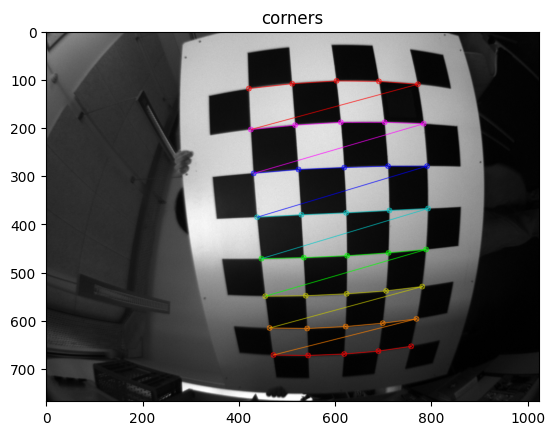

In [4]:
# Test corner extraction
sample_data_path = str(image_dir / 'Ladybug2.jpg')
image = cv.imread(sample_data_path)
corners = extract_corners(image, pattern_size)

if corners is not None:
    cv.drawChessboardCorners(image, pattern_size, corners, True)       
    plt.title('corners')
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.show()

In [5]:
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
image_size = (images[-1].shape[0], images[-1].shape[1])
_objpoints = np.zeros((pattern_size[0] * pattern_size[1] ,3), np.float32)
_objpoints[:,:2] = np.mgrid[:pattern_size[0],:pattern_size[1]].T.reshape(-1,2)
for img in images:
    corners = extract_corners(img, pattern_size)
    if corners is not None:
        objpoints.append(_objpoints)
        imgpoints.append(corners)

objpoints = np.array(objpoints)
imgpoints = np.array(imgpoints)

In [6]:
mtx, dist, rvecs, tvecs, param_history = calibration(objpoints, imgpoints, niter=20)

Defining sympy symbols
Calculating jacobian and residual of objective over params
Optimizing params


  5%|▌         | 1/20 [00:11<03:47, 11.96s/it]

[iter 0] residual: 114066.20367465238


 10%|█         | 2/20 [00:25<03:49, 12.77s/it]

[iter 1] residual: 53027.16782043326


 15%|█▌        | 3/20 [00:38<03:39, 12.90s/it]

[iter 2] residual: 23644.21495728624


 20%|██        | 4/20 [00:48<03:08, 11.78s/it]

[iter 3] residual: 12390.696379003366


 25%|██▌       | 5/20 [01:01<03:01, 12.11s/it]

[iter 4] residual: 6915.838572844699


 30%|███       | 6/20 [01:13<02:51, 12.22s/it]

[iter 5] residual: 3928.991065075378


 35%|███▌      | 7/20 [01:27<02:45, 12.74s/it]

[iter 6] residual: 2165.458576735235


 40%|████      | 8/20 [01:39<02:31, 12.67s/it]

[iter 7] residual: 1196.8160921555784


 45%|████▌     | 9/20 [01:51<02:16, 12.40s/it]

[iter 8] residual: 678.9812812710111


 50%|█████     | 10/20 [02:03<02:03, 12.36s/it]

[iter 9] residual: 461.1070657280057


 55%|█████▌    | 11/20 [02:16<01:51, 12.38s/it]

[iter 10] residual: 340.7068041594465


 60%|██████    | 12/20 [02:29<01:40, 12.61s/it]

[iter 11] residual: 322.12622624605575


 65%|██████▌   | 13/20 [02:42<01:29, 12.75s/it]

[iter 12] residual: 321.30487526567845


 70%|███████   | 14/20 [02:55<01:16, 12.70s/it]

[iter 13] residual: 329.5014658408006


 75%|███████▌  | 15/20 [03:08<01:04, 12.91s/it]

[iter 14] residual: 291.53586584536424


 80%|████████  | 16/20 [03:21<00:51, 12.87s/it]

[iter 15] residual: 323.6508405407466


 85%|████████▌ | 17/20 [03:31<00:36, 12.04s/it]

[iter 16] residual: 296.26324986431086


 90%|█████████ | 18/20 [03:44<00:24, 12.34s/it]

[iter 17] residual: 315.0952272451863


 95%|█████████▌| 19/20 [03:56<00:12, 12.23s/it]

[iter 18] residual: 291.7744154533317


100%|██████████| 20/20 [04:10<00:00, 12.51s/it]

[iter 19] residual: 321.068804423493


Final residual: 284.8783594780627)


[My implementation] projected points
-------------------- 1-th iteration --------------------


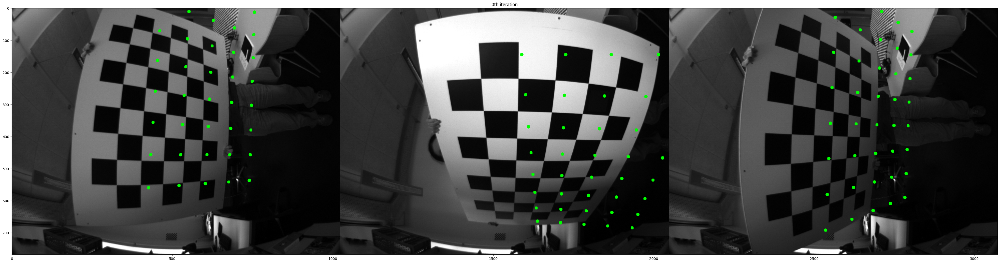

-------------------- 6-th iteration --------------------


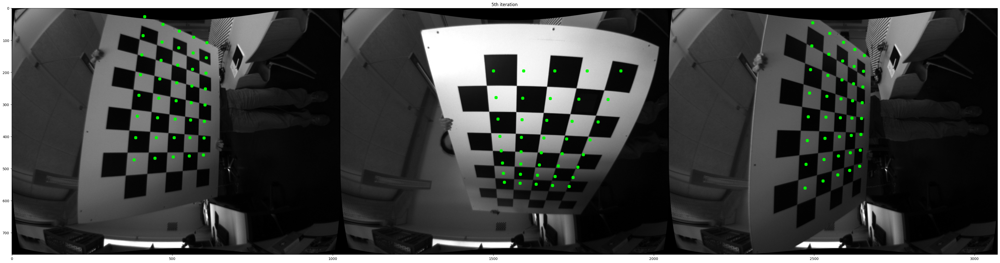

-------------------- 11-th iteration --------------------


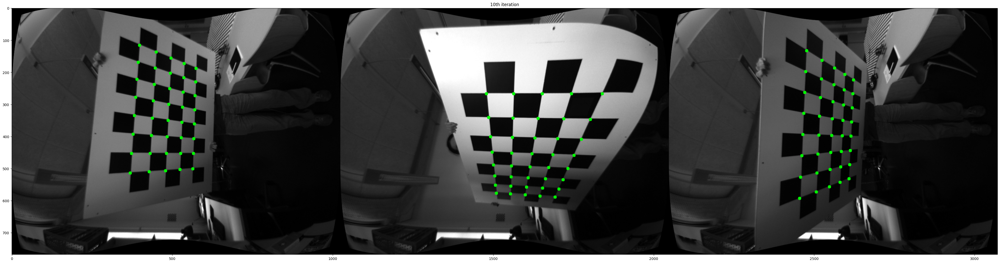

-------------------- 16-th iteration --------------------


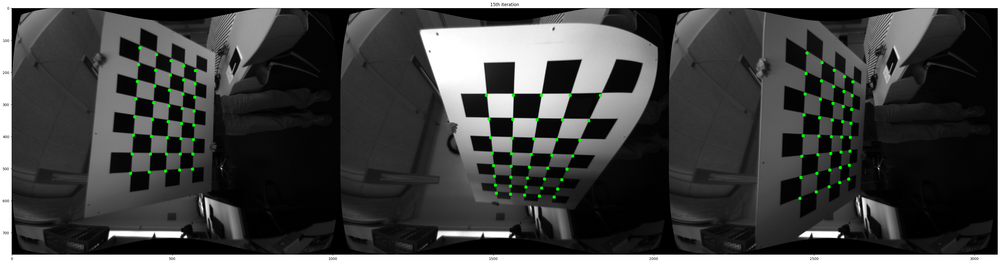

-------------------- 21-th iteration --------------------


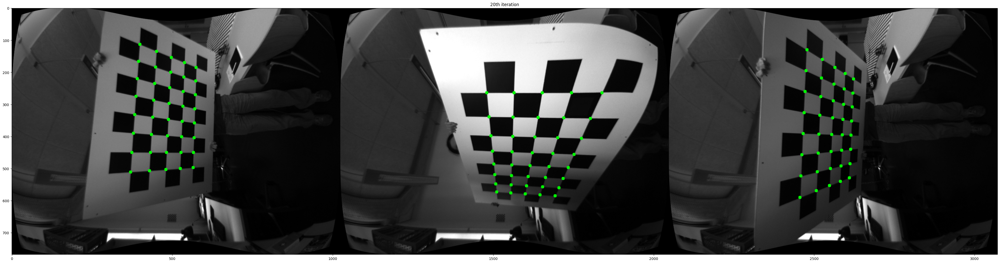

In [7]:
from tqdm import tqdm
import scipy.linalg as la
plt.rcParams["figure.figsize"] = (50,30)

N = len(objpoints)
M = len(objpoints[0])

print("[My implementation] projected points")
for i, params in enumerate(param_history):
        if i % 5 != 0:
                continue
        print("-" * 20, f"{i+1}-th iteration", "-" * 20)
        mtx, dist, rvecs, tvecs = params
        projected_images = []
        for n in range(0, N, 5):
                img = images[n]
                h,  w = img.shape[:2]
                newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

                # undistort
                mapx, mapy = cv.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w,h), 5)
                dst = cv.remap(img, mapx, mapy, cv.INTER_LINEAR)

                # project point
                image_points, jac = cv.projectPoints(objpoints[n], rvecs[n], tvecs[n], newcameramtx, np.zeros([1, 14]))
                image_points = np.int32(image_points).reshape(-1,2)

                for img_point in image_points:
                        cv.circle(dst, tuple(img_point), 5, (0, 255, 0), -1)
                projected_images.append(dst)
                
        display = cv.hconcat([img for img in projected_images])
        plt.title(f'{i}th iteration')
        plt.imshow(cv.cvtColor(display, cv.COLOR_BGR2RGB))
        plt.show()

[OpenCV `cv.calibrateCamera`] projected points


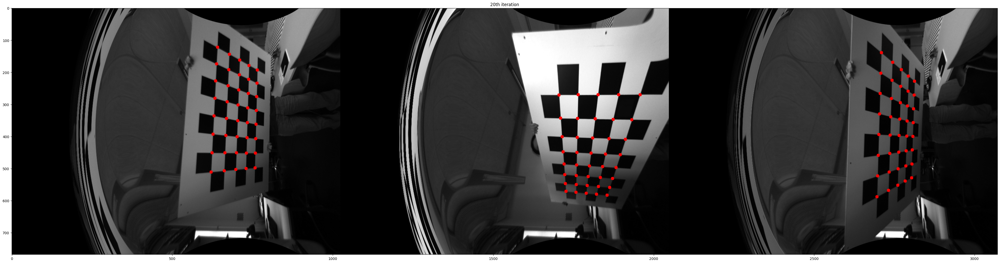

In [8]:
from tqdm import tqdm
import scipy.linalg as la
plt.rcParams["figure.figsize"] = (50,30)

N = len(objpoints)
M = len(objpoints[0])


_, mtx, dist, rvecs, tvecs = cv.calibrateCamera(
    objpoints, imgpoints, image_size, None, None
)

print("[OpenCV `cv.calibrateCamera`] projected points")
projected_images = []
for n in range(0, N, 5):
        img = images[n]
        h,  w = img.shape[:2]
        newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

        # undistort
        mapx, mapy = cv.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w,h), 5)
        dst = cv.remap(img, mapx, mapy, cv.INTER_LINEAR)

        # project point
        image_points, jac = cv.projectPoints(objpoints[n], rvecs[n], tvecs[n], newcameramtx, np.zeros([1, 14]))
        image_points = np.int32(image_points).reshape(-1,2)

        for img_point in image_points:
                cv.circle(dst, tuple(img_point), 5, (0, 0, 255), -1)
        projected_images.append(dst)
        
display = cv.hconcat([img for img in projected_images])
plt.title(f'{i}th iteration')
plt.imshow(cv.cvtColor(display, cv.COLOR_BGR2RGB))
plt.show()